In [1]:
import numpy as np
import pandas as pd

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl

In [3]:
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler, Normalizer, PolynomialFeatures

In [4]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import r2_score, roc_curve, auc
from sklearn.model_selection import train_test_split, GridSearchCV

In [5]:
import tensorflow as tf
import tensorflow_probability as tfp
from tensorflow.keras import datasets, models
from tensorflow.keras.layers import Dense, Flatten, Dropout, Activation, Input, Normalization

In [6]:
import joblib

In [7]:
import datetime

In [8]:
%matplotlib inline

### Загружаем данные из excel таблиц

In [9]:
xbp = pd.read_excel('data/X_bp.xlsx')
xnup = pd.read_excel('data/X_nup.xlsx')

In [10]:
xbp

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0.0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000
1,1.0,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000
2,2.0,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000
3,3.0,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000
4,4.0,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000
...,...,...,...,...,...,...,...,...,...,...,...
1018,1018.0,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019,1019.0,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020,1020.0,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,1021.0,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [11]:
xnup

,Unnamed: 0,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.0,0.0,4.000000,57.000000
1,1.0,0.0,4.000000,60.000000
2,2.0,0.0,4.000000,70.000000
3,3.0,0.0,5.000000,47.000000
4,4.0,0.0,5.000000,57.000000
...,...,...,...,...
1035,1035.0,90.0,8.088111,47.759177
1036,1036.0,90.0,7.619138,66.931932
1037,1037.0,90.0,9.800926,72.858286
1038,1038.0,90.0,10.079859,65.519479


### Соединяем два датасета согласно заданию и отбрасываем возникший в результате чтения из excel первый столбец

In [12]:
xbp.drop(labels=['Unnamed: 0'], axis=1, inplace=True)
xnup.drop(labels=['Unnamed: 0'], axis=1, inplace=True)

In [13]:
df = pd.concat([xbp, xnup], axis=1, join='inner')
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


### Разведочный анализ данных. Средние значения, медианы, стандартное отклонение и квантили по каждому столбцу

In [14]:
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,44.252199,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,45.015793,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,90.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,90.000000,14.440522,103.988901


### Проверка на пропуски

In [15]:
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

### Гистограммы распределения, "ящик с усами"

In [16]:
def hist_and_boxplot(df: pd.DataFrame) -> None:
    for i_column in df.columns:
        print('{column}:'.format(column=i_column))

        series = df[i_column]
        sns.set_style("darkgrid")
        sns.kdeplot(data=series, shade=True, palette='dark')
        plt.show()

        sns.boxplot(x=series);
        plt.show()

Соотношение матрица-наполнитель:


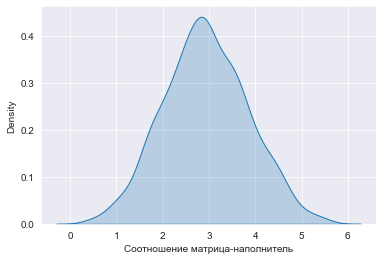

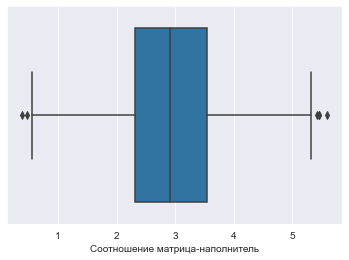

Плотность, кг/м3:


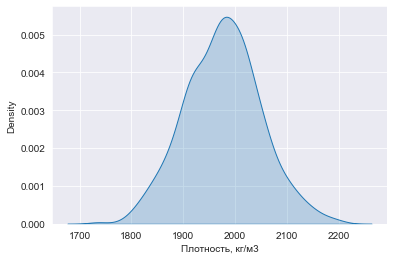

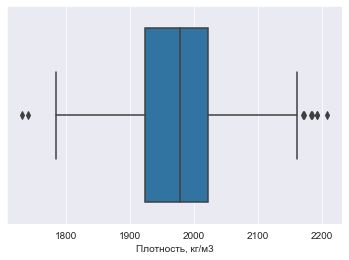

модуль упругости, ГПа:


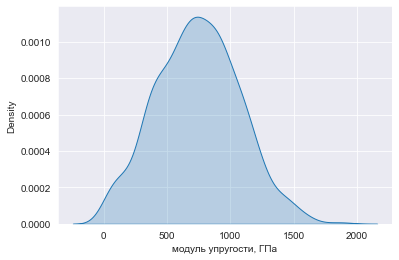

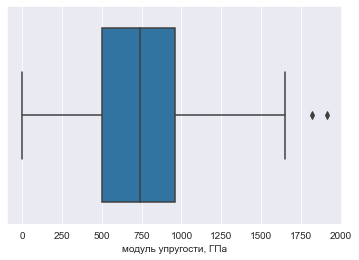

Количество отвердителя, м.%:


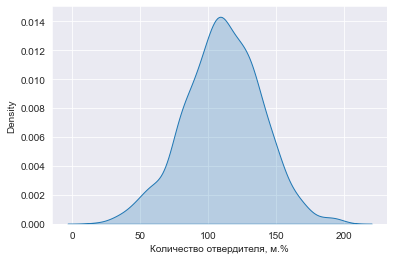

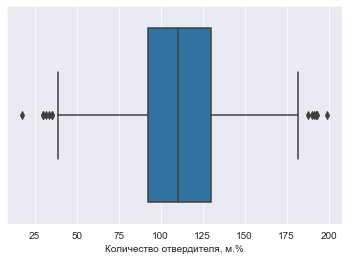

Содержание эпоксидных групп,%_2:


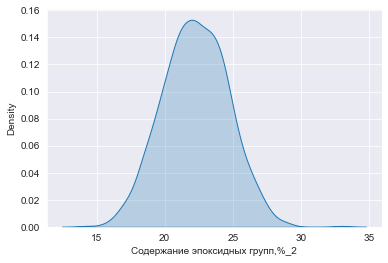

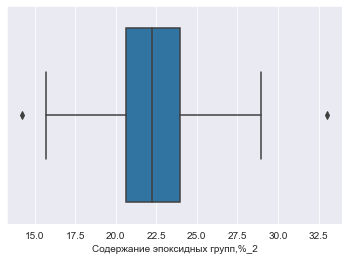

Температура вспышки, С_2:


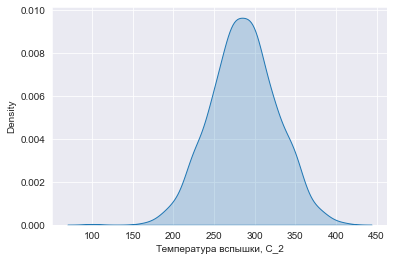

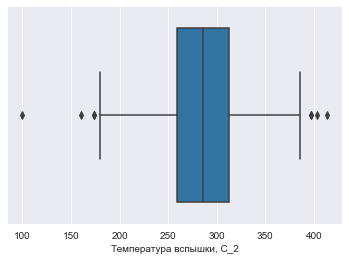

Поверхностная плотность, г/м2:


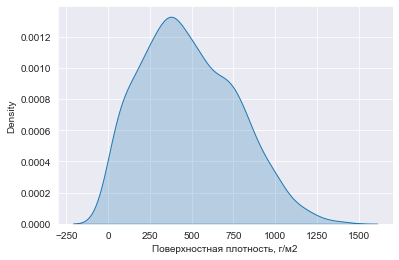

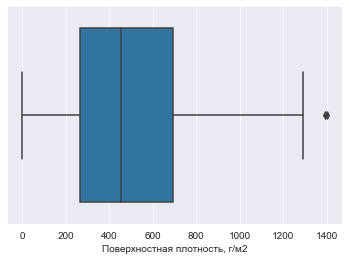

Модуль упругости при растяжении, ГПа:


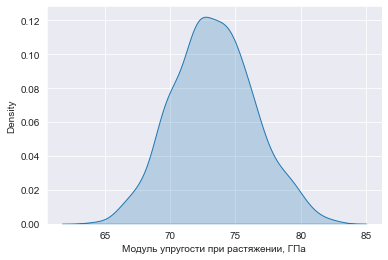

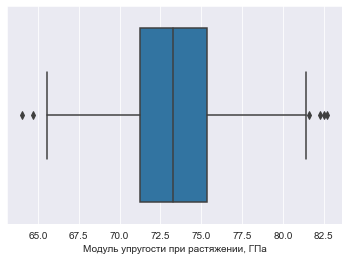

Прочность при растяжении, МПа:


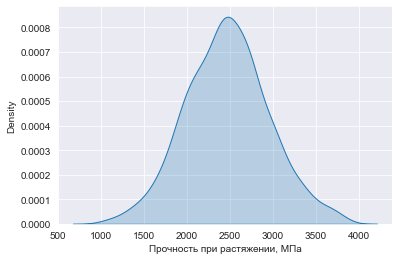

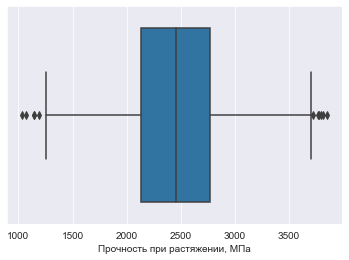

Потребление смолы, г/м2:


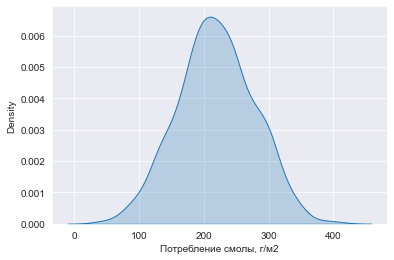

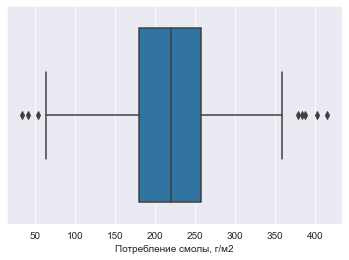

Угол нашивки, град:


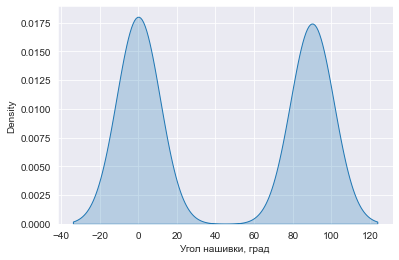

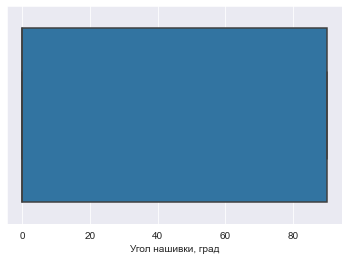

Шаг нашивки:


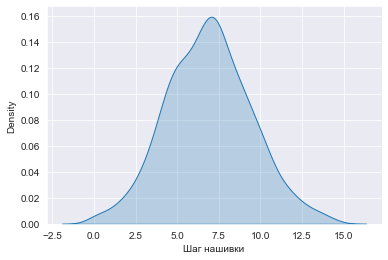

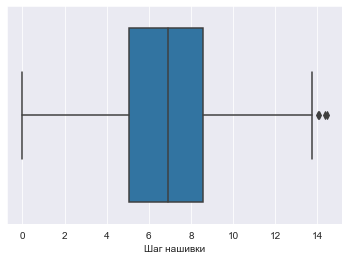

Плотность нашивки:


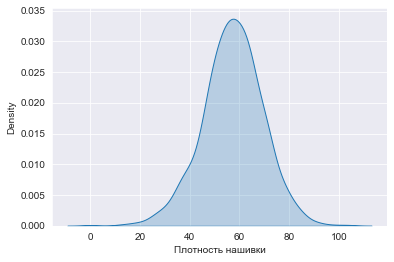

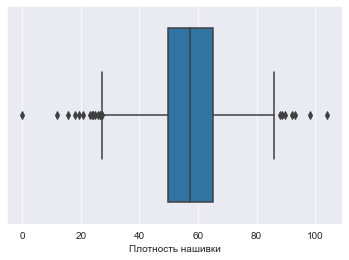

In [17]:
hist_and_boxplot(df)

array([[<AxesSubplot:xlabel='Соотношение матрица-наполнитель', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='Плотность, кг/м3', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='модуль упругости, ГПа', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='Количество отвердителя, м.%', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='Содержание эпоксидных групп,%_2', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='Температура вспышки, С_2', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='Поверхностная плотность, г/м2', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='Модуль упругости при растяжении, ГПа', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='Прочность при растяжении, МПа', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='Потребление смолы, г/м2', ylabel='Соотношение матриц

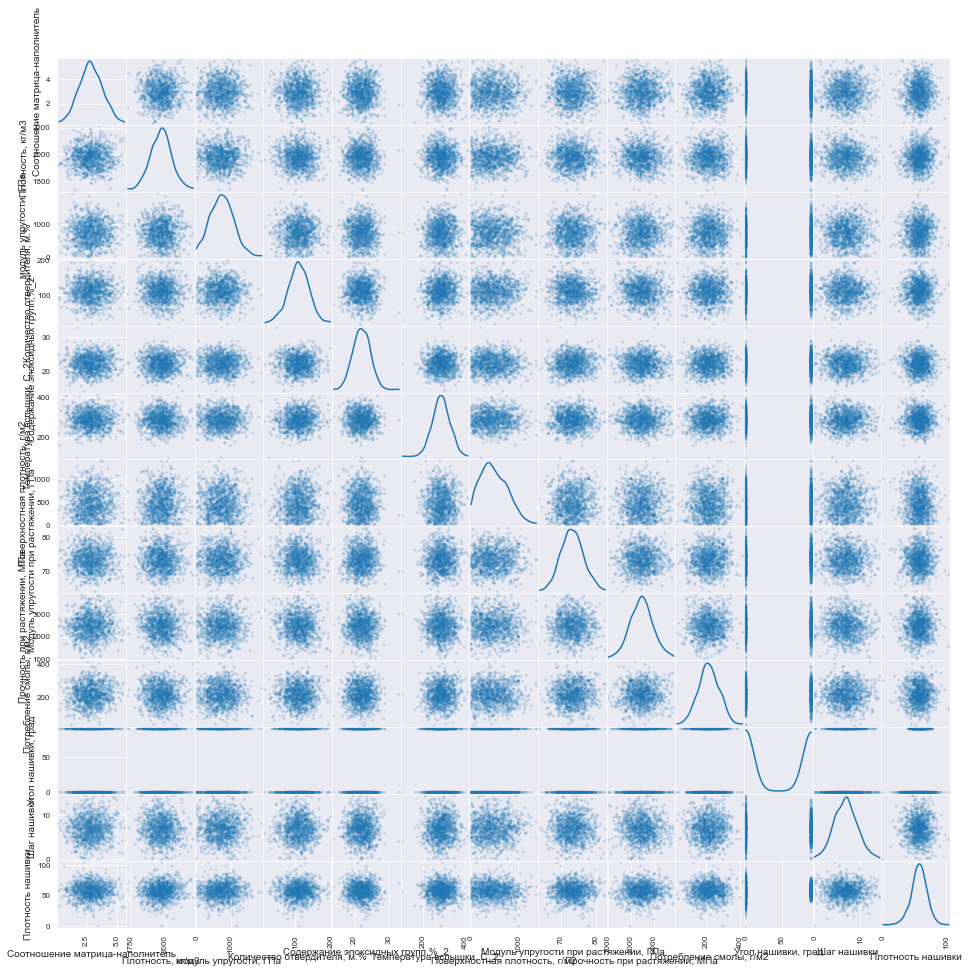

In [18]:
pd.plotting.scatter_matrix(df, alpha=0.2, figsize=(16, 16), diagonal='kde')

### Удаляем выбросы по тем стобцам, которые соотвествуют нормальному распределению(кроме угла нашивки)

In [19]:
def remove_outliers_inplace(df: pd.DataFrame, columns_to_remove: list) -> None:
    for i_column in filter_columns:
        q75, q25 = np.percentile(df.loc[:, i_column], [75, 25])
        intr_qr = q75 - q25
        column_max = q75 + (1.5 * intr_qr)
        column_min = q25 - (1.5 * intr_qr)
        df.loc[df[i_column] < column_min, i_column] = np.nan
        df.loc[df[i_column] > column_max, i_column] = np.nan

In [20]:
filter_columns = [i_column for i_column in df.columns if i_column not in 'Угол нашивки, град']
filter_columns

['Соотношение матрица-наполнитель',
 'Плотность, кг/м3',
 'модуль упругости, ГПа',
 'Количество отвердителя, м.%',
 'Содержание эпоксидных групп,%_2',
 'Температура вспышки, С_2',
 'Поверхностная плотность, г/м2',
 'Модуль упругости при растяжении, ГПа',
 'Прочность при растяжении, МПа',
 'Потребление смолы, г/м2',
 'Шаг нашивки',
 'Плотность нашивки']

### Заменяем на NaN все значения, которые слишком сильно отличаются от нижней и верхней границы.
##### По верхней границе это будет максимальное значение не больше чем 75% квантиль + 1.5 интервала между 75% квантилем и 25% квантилем
##### По нижней границе это будет минимальное значение не меньше чем 25% квантиль - 1.5 интервала между 75% квантилем и 25% квантилем

In [21]:
remove_outliers_inplace(df, filter_columns)

In [22]:
df.isnull().sum()

Соотношение матрица-наполнитель          6
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             14
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 8
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           11
Потребление смолы, г/м2                  8
Угол нашивки, град                       0
Шаг нашивки                              4
Плотность нашивки                       21
dtype: int64

In [23]:
df.dropna(inplace=True)
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,60.000000
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


### Проверим набор данных ещё раз, построив гистограммы распределения и ящик с усами
##### Как видно из графиков "ящик с усами", для некоторых переменных всё ещё существуют выбросы

Соотношение матрица-наполнитель:


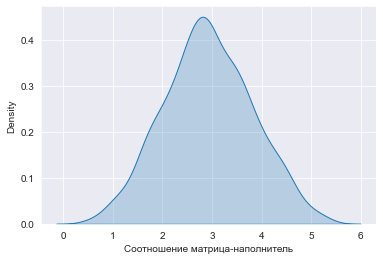

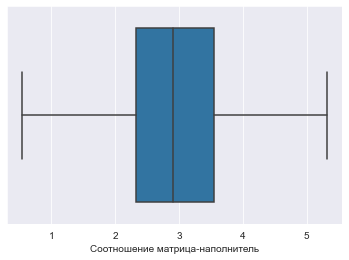

Плотность, кг/м3:


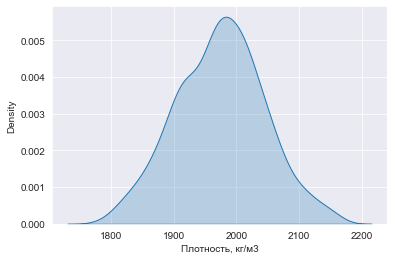

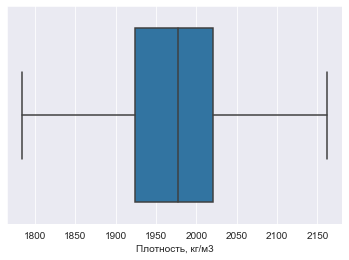

модуль упругости, ГПа:


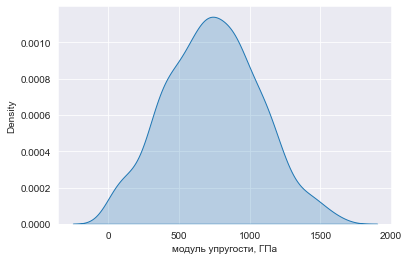

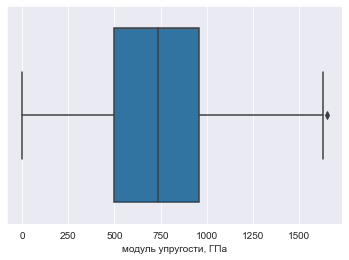

Количество отвердителя, м.%:


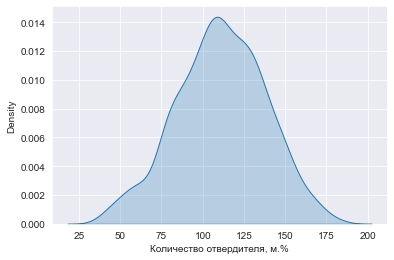

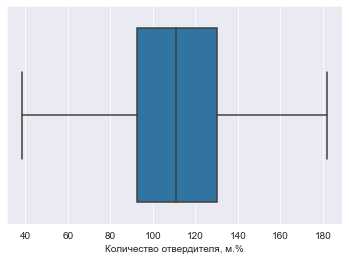

Содержание эпоксидных групп,%_2:


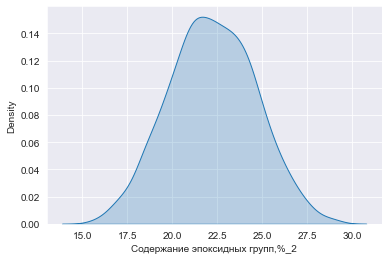

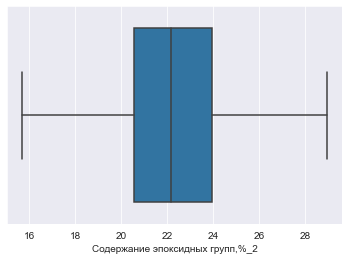

Температура вспышки, С_2:


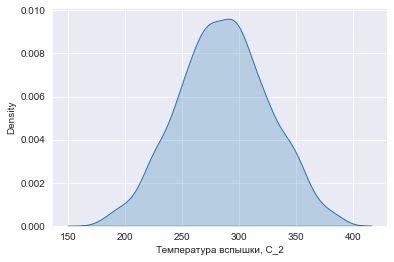

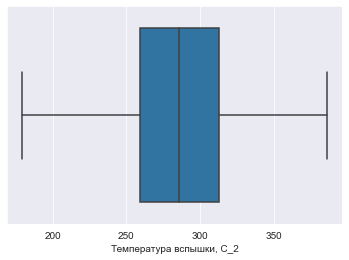

Поверхностная плотность, г/м2:


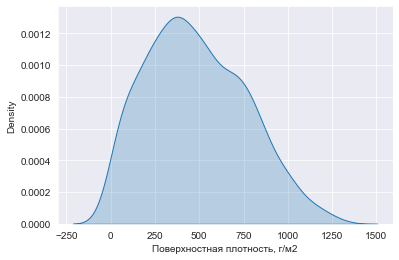

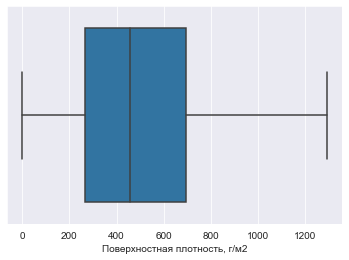

Модуль упругости при растяжении, ГПа:


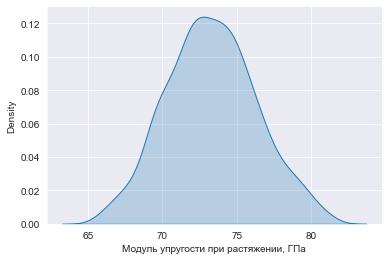

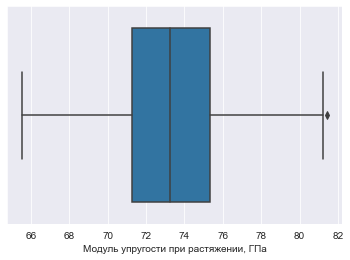

Прочность при растяжении, МПа:


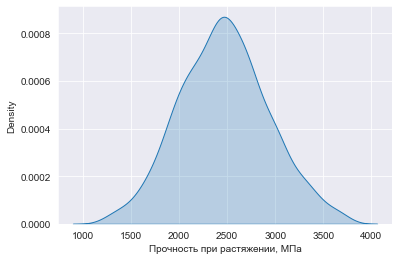

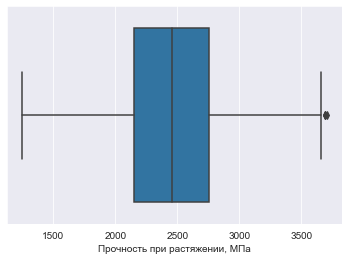

Потребление смолы, г/м2:


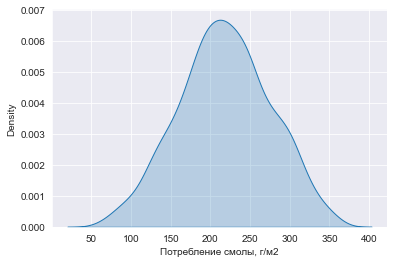

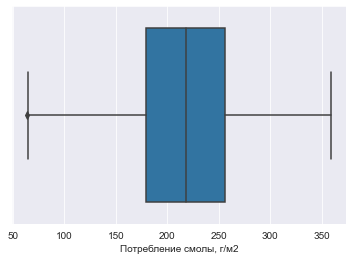

Угол нашивки, град:


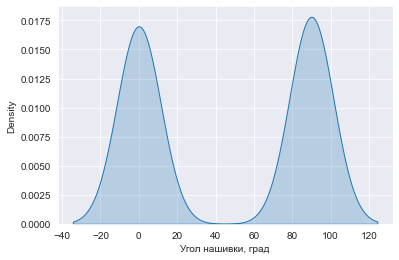

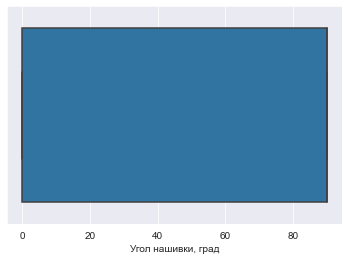

Шаг нашивки:


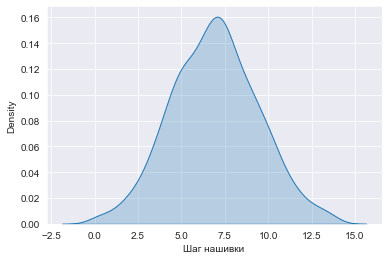

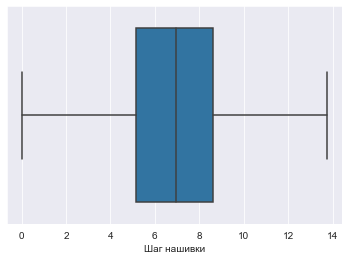

Плотность нашивки:


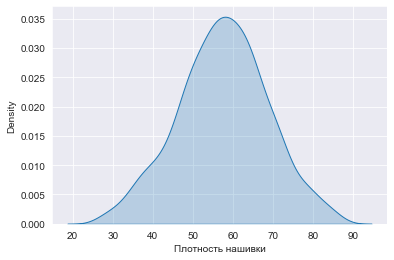

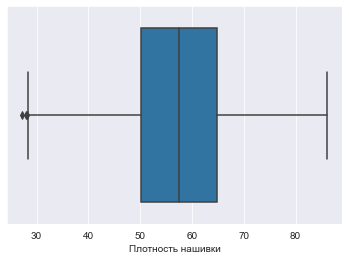

In [24]:
hist_and_boxplot(df)

### Ещё раз удаляем выбросы

In [25]:
filter_columns_2 =      [
                            'Плотность нашивки', 
                            'Потребление смолы, г/м2', 
                            'Прочность при растяжении, МПа', 
                            'Модуль упругости при растяжении, ГПа'
                        ]

remove_outliers_inplace(df, filter_columns_2)

In [26]:
df.dropna(inplace=True)

Соотношение матрица-наполнитель:


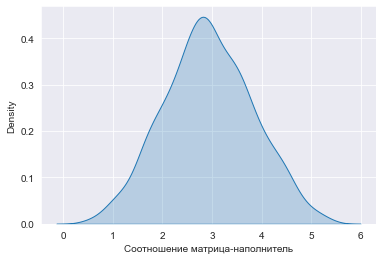

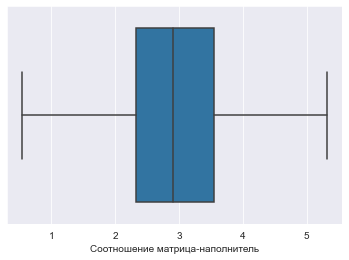

Плотность, кг/м3:


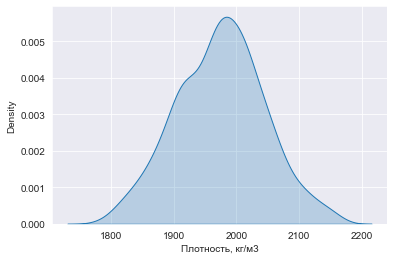

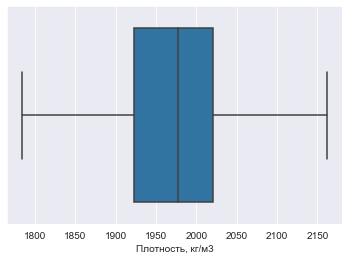

модуль упругости, ГПа:


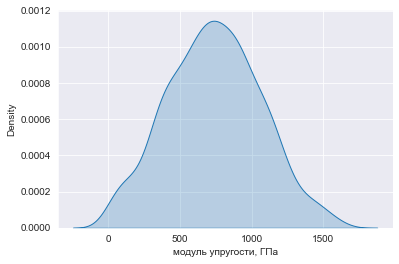

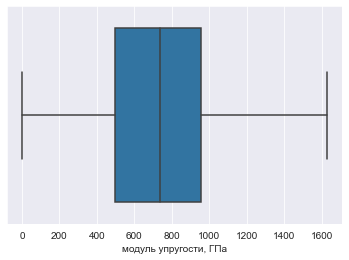

Количество отвердителя, м.%:


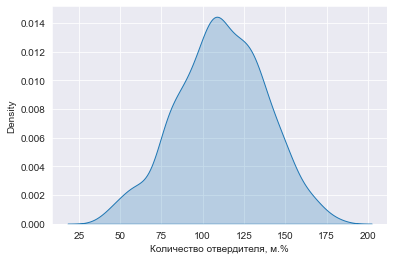

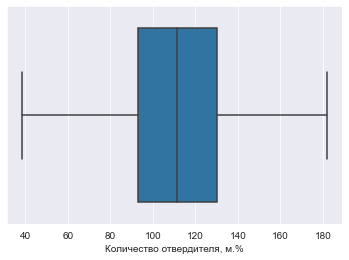

Содержание эпоксидных групп,%_2:


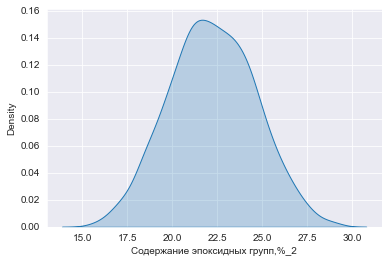

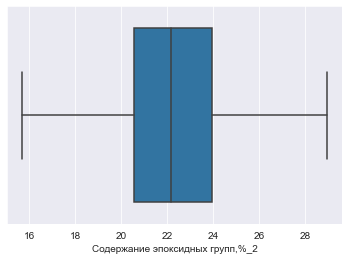

Температура вспышки, С_2:


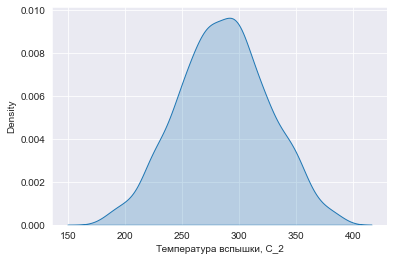

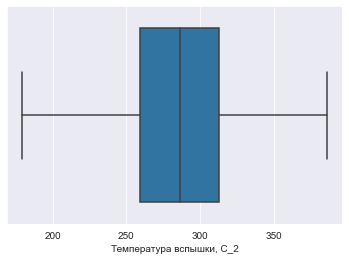

Поверхностная плотность, г/м2:


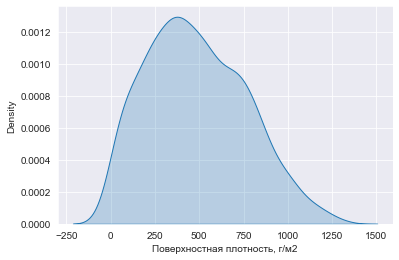

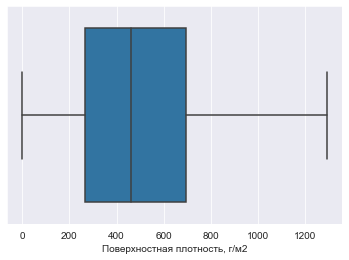

Модуль упругости при растяжении, ГПа:


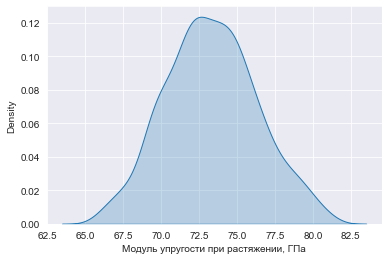

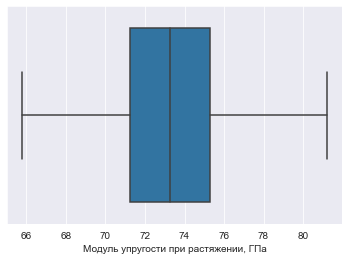

Прочность при растяжении, МПа:


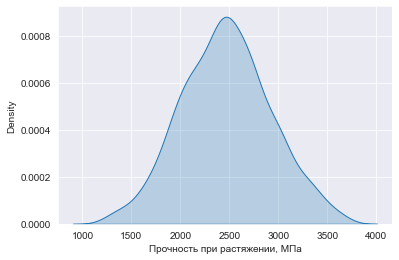

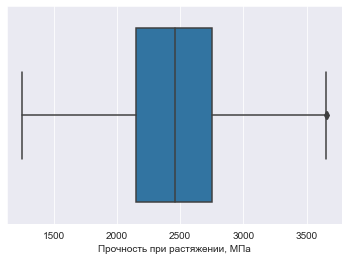

Потребление смолы, г/м2:


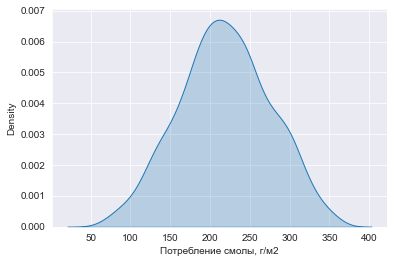

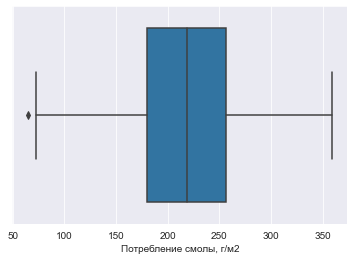

Угол нашивки, град:


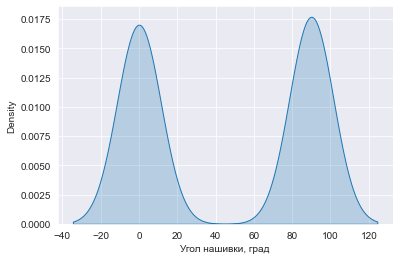

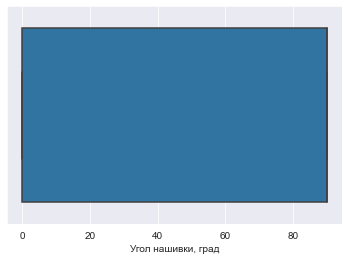

Шаг нашивки:


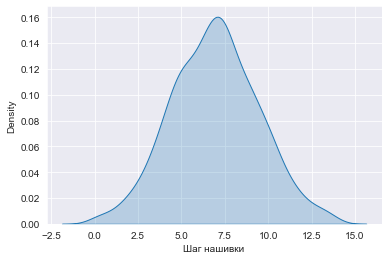

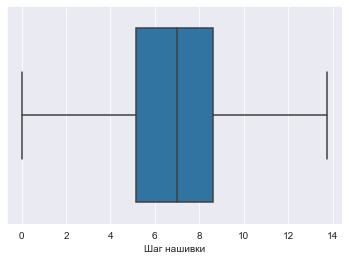

Плотность нашивки:


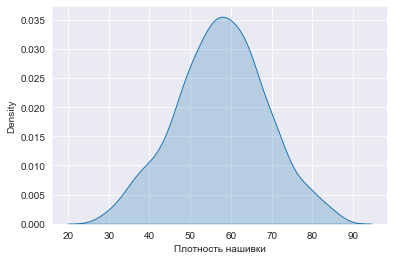

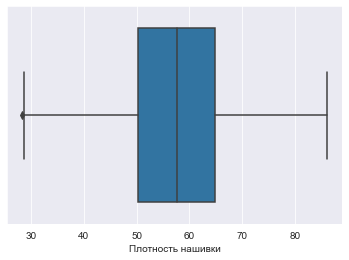

In [27]:
hist_and_boxplot(df)

In [28]:
filter_columns_3 = ['Потребление смолы, г/м2']
remove_outliers_inplace(df, filter_columns_3)
df.dropna(inplace=True)
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,60.000000
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


Соотношение матрица-наполнитель:


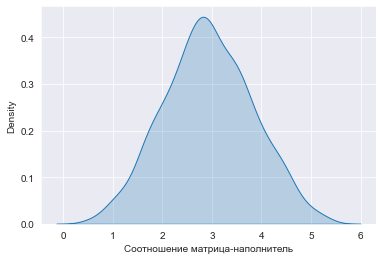

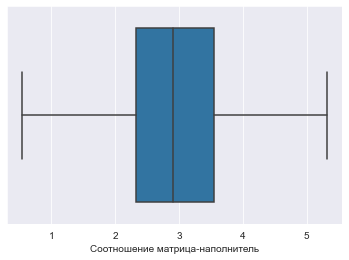

Плотность, кг/м3:


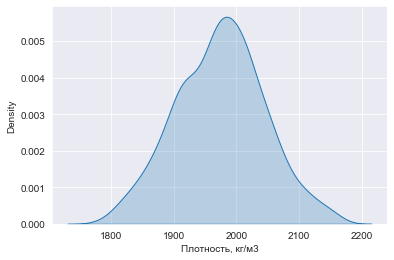

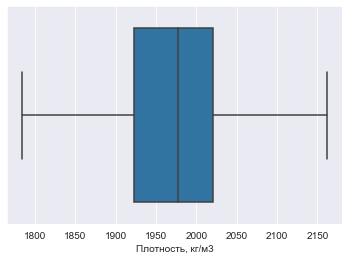

модуль упругости, ГПа:


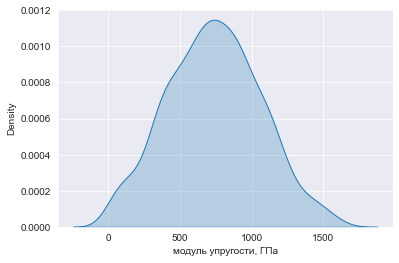

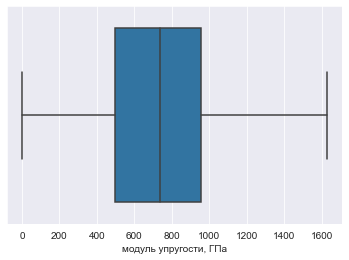

Количество отвердителя, м.%:


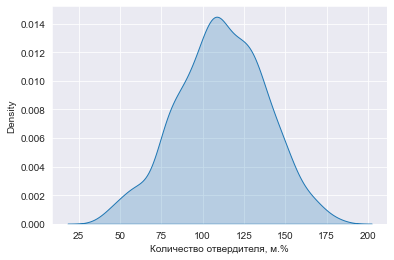

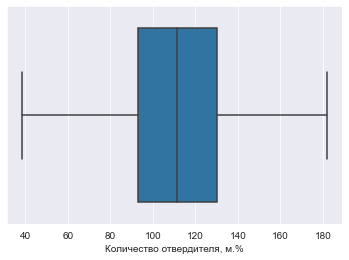

Содержание эпоксидных групп,%_2:


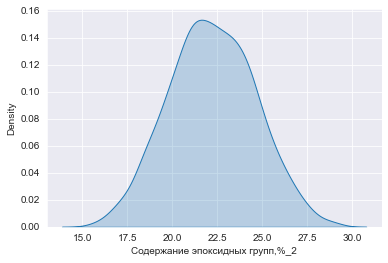

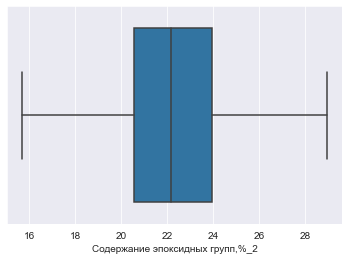

Температура вспышки, С_2:


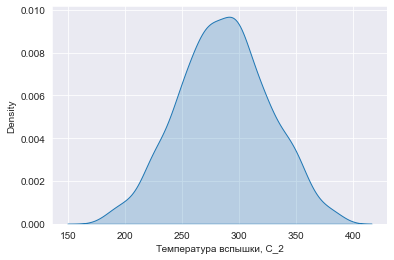

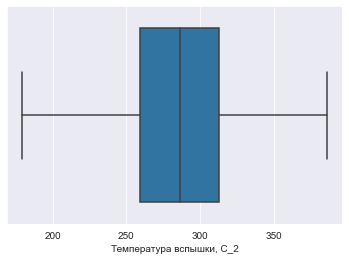

Поверхностная плотность, г/м2:


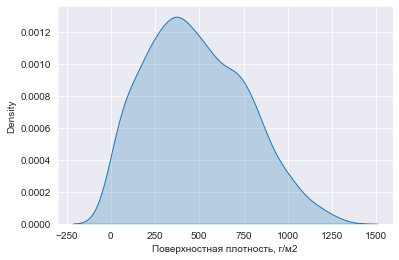

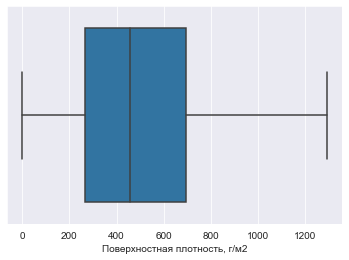

Модуль упругости при растяжении, ГПа:


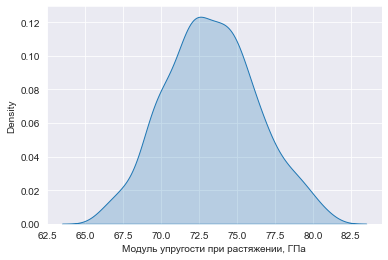

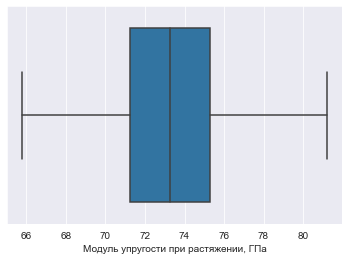

Прочность при растяжении, МПа:


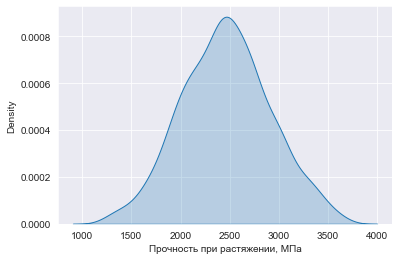

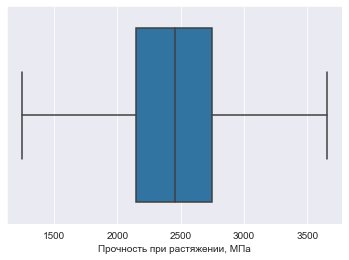

Потребление смолы, г/м2:


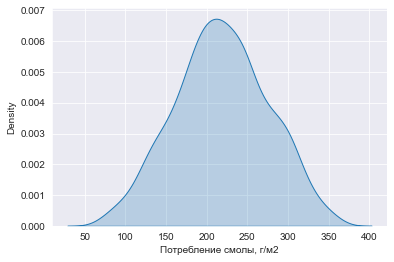

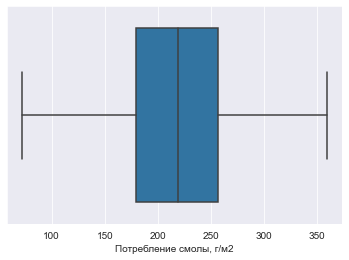

Угол нашивки, град:


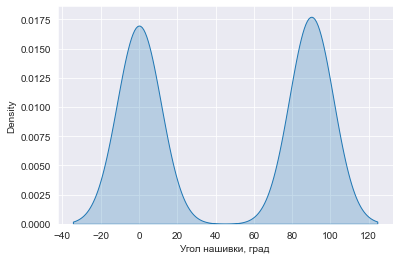

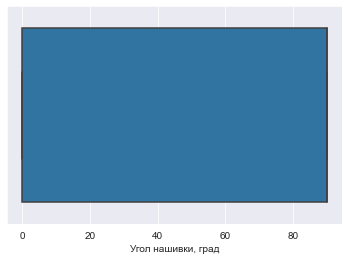

Шаг нашивки:


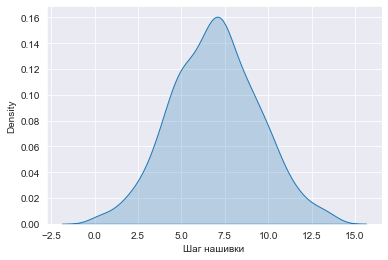

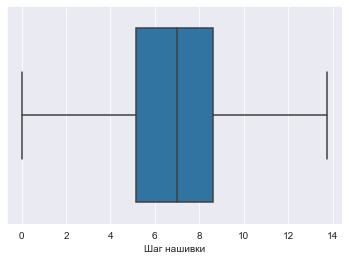

Плотность нашивки:


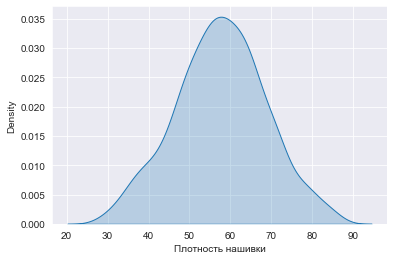

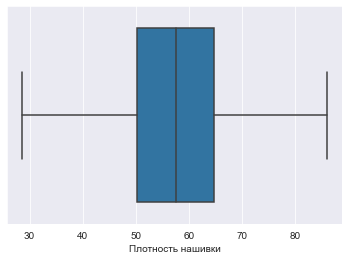

In [29]:
hist_and_boxplot(df)

### Диаграммы рассеивания

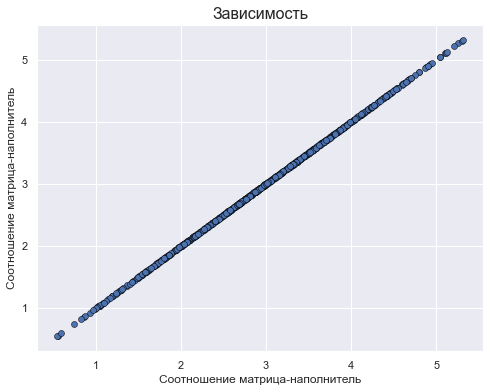

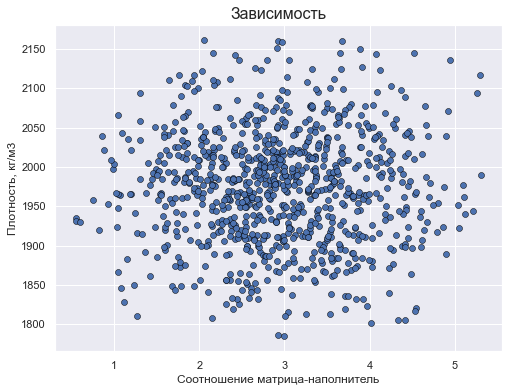

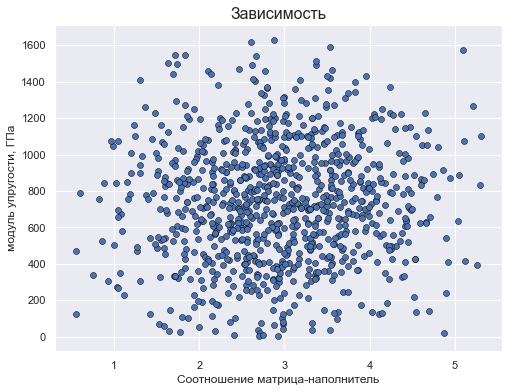

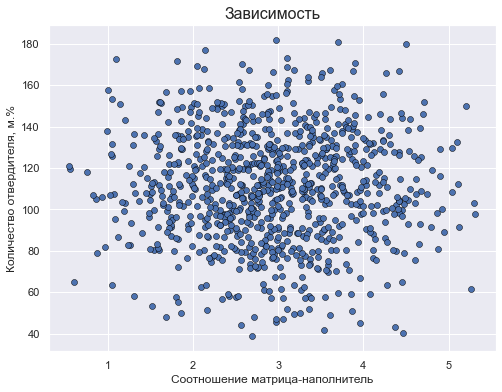

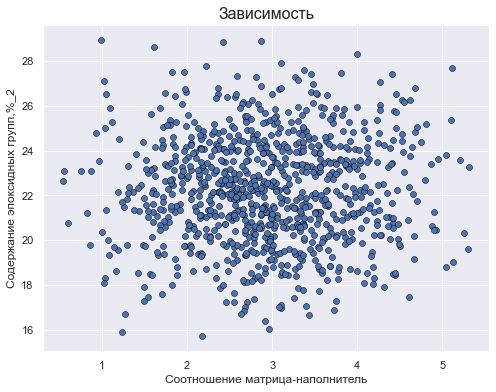

...

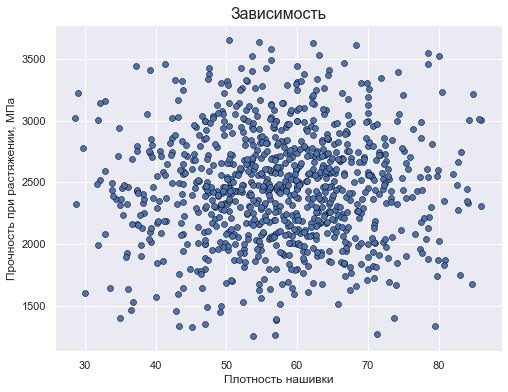

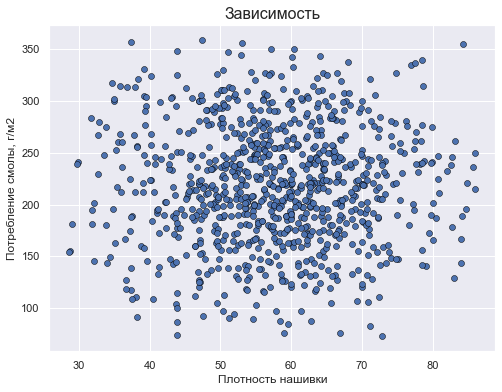

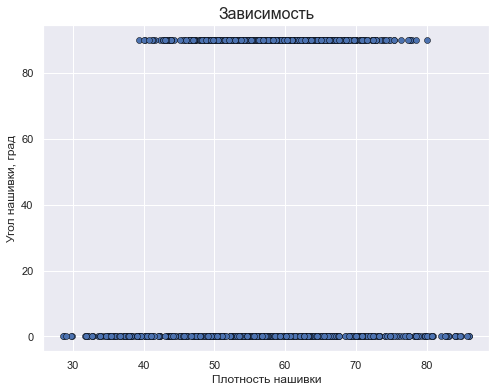

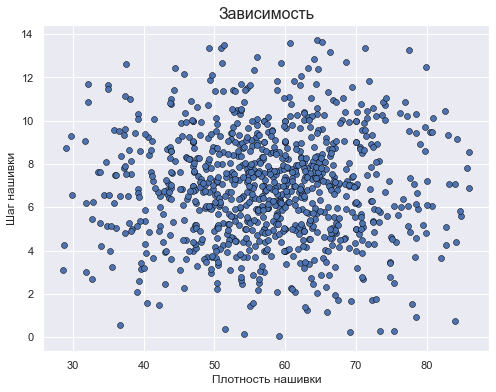

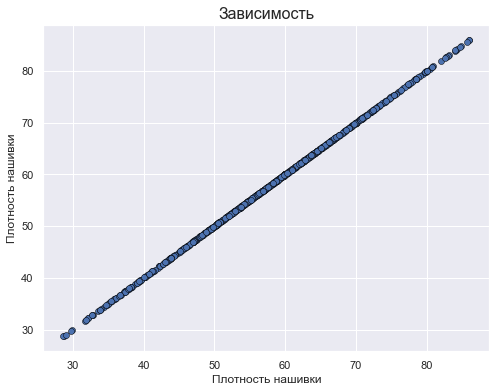

In [98]:
for x_coord in df.columns:
    for y_coord in df.columns:
        sns.set_style('darkgrid')
        plt.title('Зависимость', size=16)
        plt.xlabel(x_coord, size=12)
        plt.ylabel(y_coord, size=12)
        sns.scatterplot(x=x_coord, y=y_coord, data=df, edgecolor='black', palette='cubehelix')
        plt.show()

array([[<AxesSubplot:xlabel='Соотношение матрица-наполнитель', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='Плотность, кг/м3', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='модуль упругости, ГПа', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='Количество отвердителя, м.%', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='Содержание эпоксидных групп,%_2', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='Температура вспышки, С_2', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='Поверхностная плотность, г/м2', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='Модуль упругости при растяжении, ГПа', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='Прочность при растяжении, МПа', ylabel='Соотношение матрица-наполнитель'>,
        <AxesSubplot:xlabel='Потребление смолы, г/м2', ylabel='Соотношение матриц

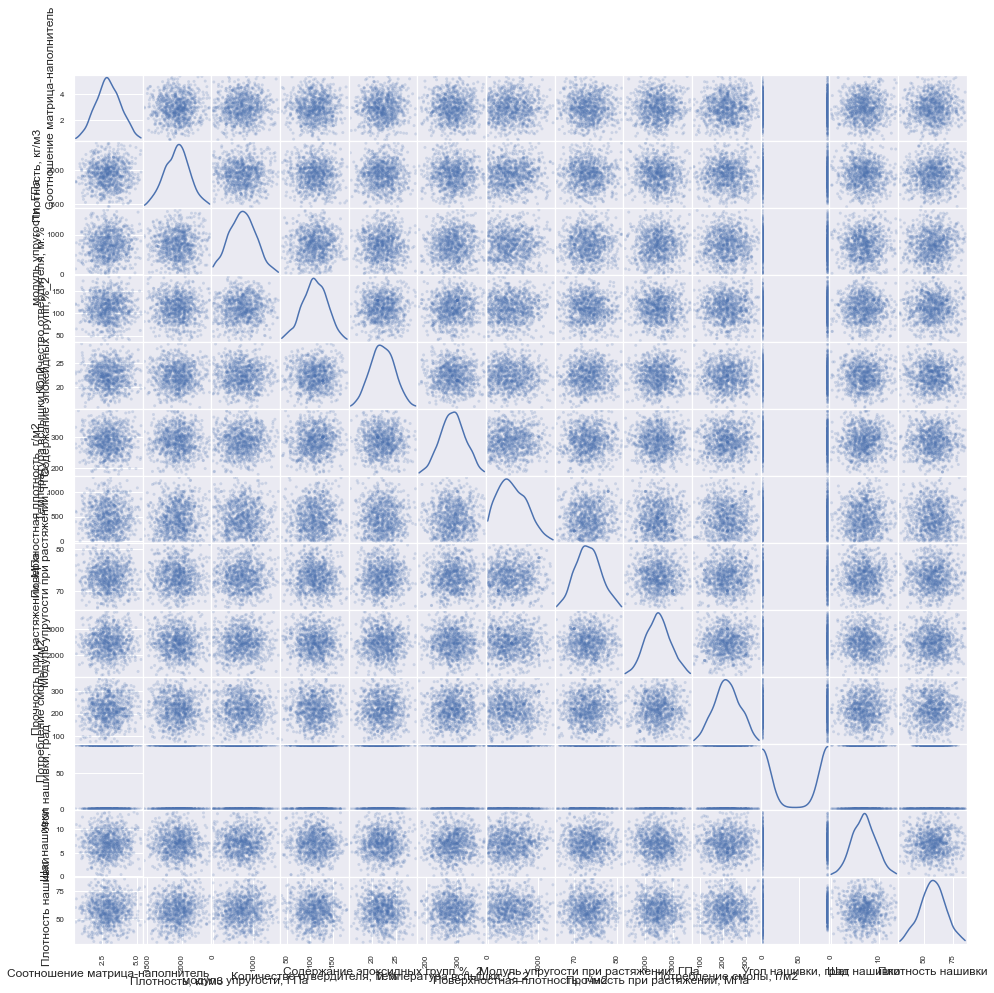

In [99]:
pd.plotting.scatter_matrix(df, alpha=0.2, figsize=(16, 16), diagonal='kde')

### Нормализация данных

In [30]:
normalizer = Normalizer()
res = normalizer.fit_transform(df)
normalized_df = pd.DataFrame(res, columns=df.columns)

In [31]:
normalized_df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.000499,0.545436,0.198490,0.013434,0.006381,0.076473,0.056424,0.018808,0.806064,0.059111,0.000000,0.001075,0.016121
1,0.000499,0.545011,0.198335,0.034634,0.005705,0.080543,0.056380,0.018793,0.805435,0.059065,0.000000,0.001342,0.012618
2,0.000744,0.544829,0.202097,0.030022,0.005976,0.076388,0.056362,0.018787,0.805167,0.059046,0.000000,0.001342,0.015298
3,0.000746,0.539271,0.201687,0.030161,0.006004,0.076742,0.056623,0.018874,0.808906,0.059320,0.000000,0.001348,0.016178
4,0.000699,0.519919,0.219673,0.030449,0.006062,0.077475,0.057164,0.019055,0.816627,0.059886,0.000000,0.001361,0.019055
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.000700,0.601520,0.281289,0.026806,0.006201,0.100077,0.064463,0.022522,0.735625,0.038520,0.027733,0.002797,0.014489
918,0.001078,0.641541,0.139172,0.045683,0.006133,0.079552,0.109733,0.022819,0.738645,0.036842,0.028164,0.003306,0.016820
919,0.000953,0.572927,0.121081,0.032107,0.006959,0.072161,0.214994,0.021709,0.773510,0.068729,0.026143,0.001209,0.019645
920,0.001191,0.664389,0.238353,0.045454,0.006187,0.088652,0.206205,0.023802,0.665970,0.063368,0.028931,0.002029,0.018728


In [102]:
normalized_df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,0.000885,0.596933,0.220034,0.033650,0.006715,0.086555,0.144856,0.022170,0.730955,0.065896,0.013900,0.002100,0.017398
std,0.000286,0.064469,0.095697,0.008970,0.001016,0.015040,0.083856,0.002484,0.069241,0.018504,0.013765,0.000808,0.003793
min,0.000163,0.444650,0.000709,0.011339,0.004113,0.049402,0.000230,0.016105,0.462927,0.021630,0.000000,0.000011,0.007195
25%,0.000685,0.552643,0.150854,0.027607,0.005990,0.076164,0.080741,0.020402,0.688019,0.052457,0.000000,0.001543,0.014855
50%,0.000872,0.591998,0.219789,0.033547,0.006653,0.084991,0.140085,0.021966,0.740423,0.065555,0.021931,0.002053,0.017293
75%,0.001067,0.640028,0.289210,0.039557,0.007346,0.096577,0.204258,0.023756,0.780490,0.077870,0.027092,0.002629,0.019756
max,0.001803,0.823683,0.524864,0.062919,0.010879,0.147861,0.414371,0.030598,0.877580,0.122973,0.037721,0.004519,0.030905


Соотношение матрица-наполнитель:


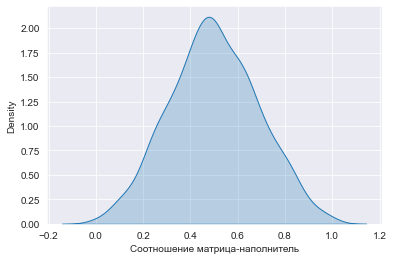

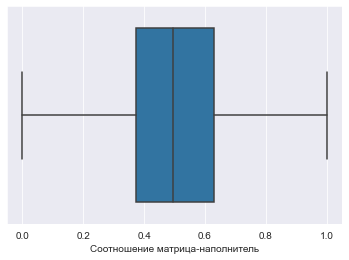

Плотность, кг/м3:


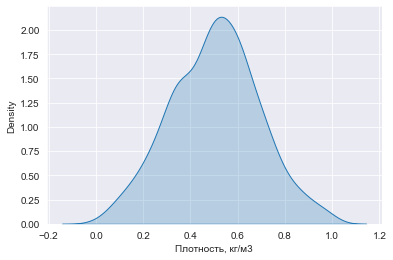

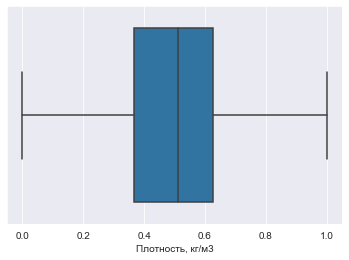

модуль упругости, ГПа:


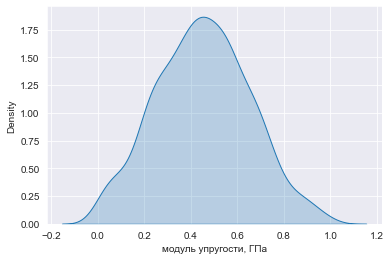

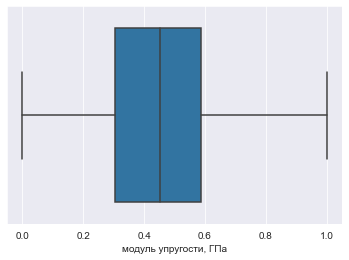

Количество отвердителя, м.%:


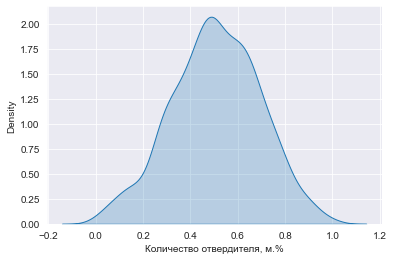

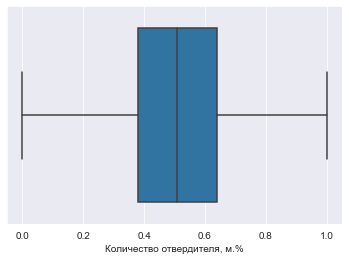

Содержание эпоксидных групп,%_2:


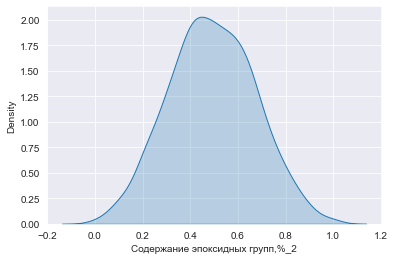

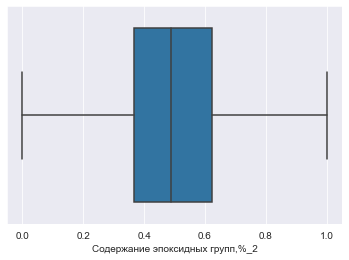

Температура вспышки, С_2:


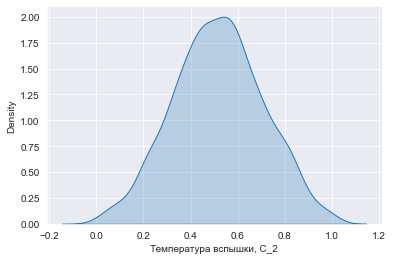

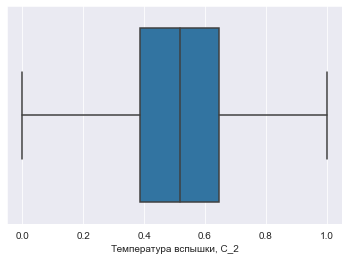

Поверхностная плотность, г/м2:


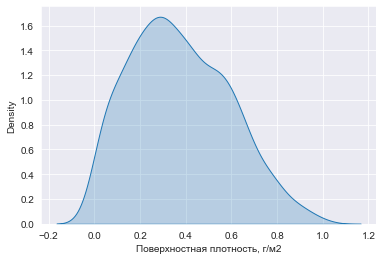

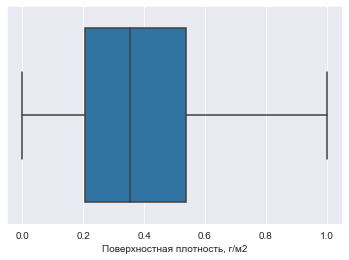

Модуль упругости при растяжении, ГПа:


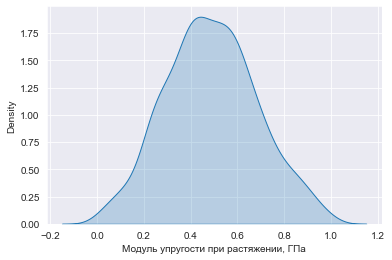

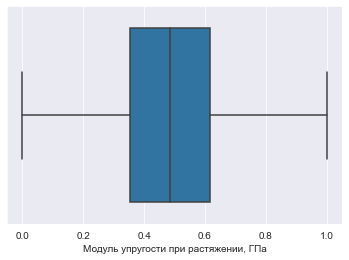

Прочность при растяжении, МПа:


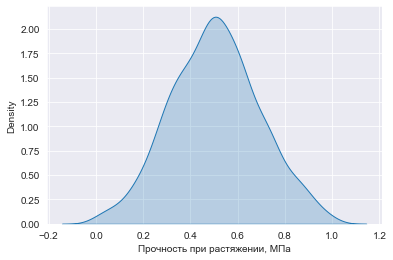

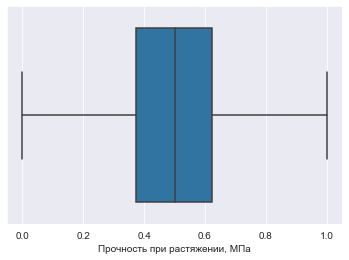

Потребление смолы, г/м2:


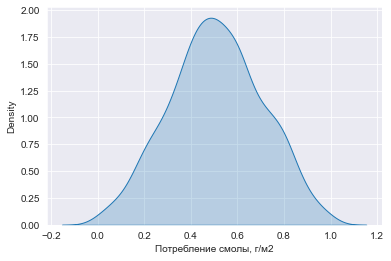

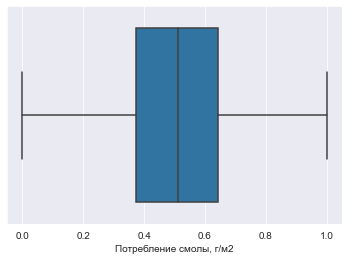

Угол нашивки, град:


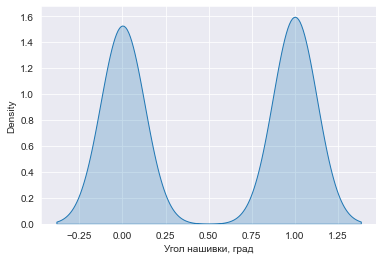

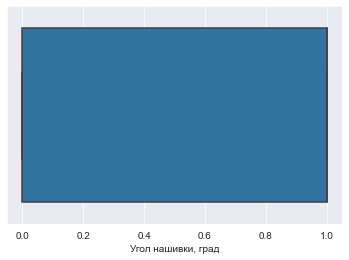

Шаг нашивки:


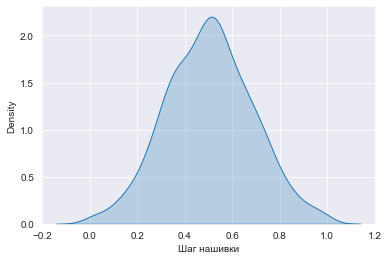

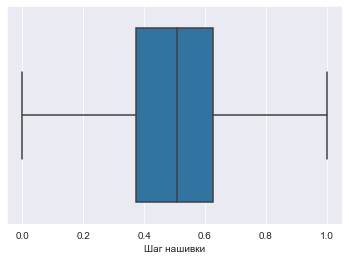

Плотность нашивки:


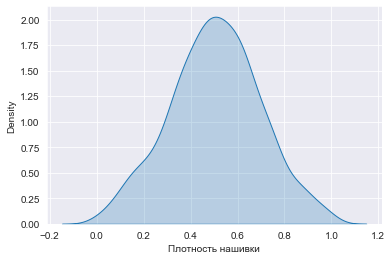

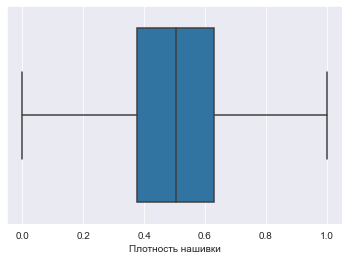

In [36]:
hist_and_boxplot(normalized_df)

### Матрица корелляция между столбцами

<AxesSubplot:>

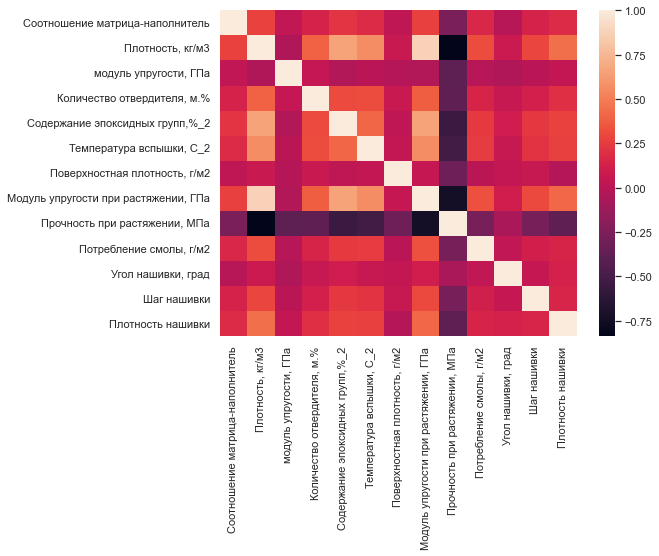

In [103]:
sns.set(rc={'figure.figsize':(8,6)})
sns.heatmap(normalized_df.corr())

In [38]:
normalized_df.corr().nlargest(3, df.columns)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.007996,0.051643,0.001353,0.021982,-0.010565,0.011910,-0.024316,0.019141,0.076857,-0.032144,0.039924,0.047835
"Потребление смолы, г/м2",0.076857,-0.009609,0.008368,-0.014827,0.010808,0.048142,-0.012606,0.051676,0.016753,1.000000,0.000433,0.009932,0.008012
"модуль упругости, ГПа",0.051643,-0.001416,1.000000,0.044550,-0.001442,0.037622,-0.007805,0.020063,0.031041,0.008368,-0.031490,0.010238,0.078810


### Обучаем несколько моделей для понимания, какая даёт лучший результат

In [104]:
normalized_df.columns.tolist()

['Соотношение матрица-наполнитель',
 'Плотность, кг/м3',
 'модуль упругости, ГПа',
 'Количество отвердителя, м.%',
 'Содержание эпоксидных групп,%_2',
 'Температура вспышки, С_2',
 'Поверхностная плотность, г/м2',
 'Модуль упругости при растяжении, ГПа',
 'Прочность при растяжении, МПа',
 'Потребление смолы, г/м2',
 'Угол нашивки, град',
 'Шаг нашивки',
 'Плотность нашивки']

In [105]:
input_columns = [
    "Плотность, кг/м3",
    "модуль упругости, ГПа",
    "Количество отвердителя, м.%",
    "Содержание эпоксидных групп,%_2",
    "Температура вспышки, С_2",
    "Поверхностная плотность, г/м2",
    "Потребление смолы, г/м2",
    "Угол нашивки, град",
    "Шаг нашивки",
    "Плотность нашивки"
]

output_columns = [
    "Соотношение матрица-наполнитель",
    "Модуль упругости при растяжении, ГПа",
    "Прочность при растяжении, МПа",
]

inputs = normalized_df[input_columns]
outputs = df[output_columns]

In [106]:
inputs

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.545436,0.198490,0.013434,0.006381,0.076473,0.056424,0.059111,0.000000,0.001075,0.016121
1,0.545011,0.198335,0.034634,0.005705,0.080543,0.056380,0.059065,0.000000,0.001342,0.012618
2,0.544829,0.202097,0.030022,0.005976,0.076388,0.056362,0.059046,0.000000,0.001342,0.015298
3,0.539271,0.201687,0.030161,0.006004,0.076742,0.056623,0.059320,0.000000,0.001348,0.016178
4,0.519919,0.219673,0.030449,0.006062,0.077475,0.057164,0.059886,0.000000,0.001361,0.019055
...,...,...,...,...,...,...,...,...,...,...
917,0.601520,0.281289,0.026806,0.006201,0.100077,0.064463,0.038520,0.027733,0.002797,0.014489
918,0.641541,0.139172,0.045683,0.006133,0.079552,0.109733,0.036842,0.028164,0.003306,0.016820
919,0.572927,0.121081,0.032107,0.006959,0.072161,0.214994,0.068729,0.026143,0.001209,0.019645
920,0.664389,0.238353,0.045454,0.006187,0.088652,0.206205,0.063368,0.028931,0.002029,0.018728


In [107]:
test_models = [
    LinearRegression(fit_intercept=True, copy_X=True),
    RandomForestRegressor(n_estimators=200, max_features ='sqrt'),
    KNeighborsRegressor(n_neighbors=10),
    SVR(kernel='linear'),
    GradientBoostingRegressor(),
]

In [108]:
x_train, x_test, y_train, y_test = train_test_split(inputs, outputs, test_size=0.3)

In [109]:
models_result = pd.DataFrame()
scores = dict()
for i_model in test_models:
    temp = dict()
    temp['model'] = i_model.__class__.__name__
    for i_target_var in y_train.columns:
        i_model.fit(x_train, y_train[i_target_var].tolist())
        temp['R2 {target}'.format(target=i_target_var)] = r2_score(y_test[i_target_var].tolist(), i_model.predict(x_test))
    models_result = models_result.append([temp])
models_result.set_index('model', inplace=True)

In [110]:
models_result

,R2 Соотношение матрица-наполнитель,"R2 Модуль упругости при растяжении, ГПа","R2 Прочность при растяжении, МПа"
model,,,
LinearRegression,-0.057675,-0.055045,0.955407
RandomForestRegressor,-0.050275,-0.084265,0.938748
KNeighborsRegressor,-0.074907,-0.131043,0.906301
SVR,-0.018821,-0.018971,0.007384
GradientBoostingRegressor,-0.113768,-0.163248,0.963254


In [46]:
test_models[0].predict(x_test[:1])[0]

2378.267402459992

In [47]:
type(df)

pandas.core.frame.DataFrame

### Подбор гиперпараметров моделей
#### Как видно из таблицы выше, наилучший результат показывает Линейная регрессия и Градиентный бустинг на параметре "Прочность при растяжении, МПа". Далее будем использовать Градиетный бустинг для проверки и поиска гиперпараметров

In [153]:
input_columns = [
    "Плотность, кг/м3",
    "модуль упругости, ГПа",
    "Количество отвердителя, м.%",
    "Содержание эпоксидных групп,%_2",
    "Температура вспышки, С_2",
    "Поверхностная плотность, г/м2",
    "Потребление смолы, г/м2",
    "Угол нашивки, град",
    "Шаг нашивки",
    "Плотность нашивки"
]

output_columns = [
    "Прочность при растяжении, МПа",
]

inputs_hyper = normalized_df[input_columns]
outputs_hyper = df[output_columns]

In [154]:
x_train, x_test, y_train, y_test = train_test_split(inputs_hyper, outputs_hyper, test_size=0.3)

In [44]:
GradientBoostingRegressor().get_params().keys()

dict_keys(['alpha', 'ccp_alpha', 'criterion', 'init', 'learning_rate', 'loss', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_iter_no_change', 'random_state', 'subsample', 'tol', 'validation_fraction', 'verbose', 'warm_start'])

In [45]:
#Зададим сетку параметров, по которым будем оптимизировать модель
grid = {'weights': ['uniform', 'distance'],
               'n_neighbors': list(np.linspace(5, 100, 10, dtype = int)),
               'algorithm': ['auto', 'ball_tree','kd_tree', 'brute'],
               'leaf_size': list(np.linspace(10, 100, 10, dtype = int))}

grid = {'loss': ['squared_error', 'absolute_error', 'huber', 'quantile'], 
        'max_depth': [2, 3, 5, 10, 15],
        #'n_estimators': np.linspace(50, 1000, 10, dtype = int),
        'criterion': ['friedman_mse', 'squared_error', 'mse', 'mae']
       }

booster = GradientBoostingRegressor()
grid_search = GridSearchCV(estimator=booster, scoring='r2', param_grid=grid, cv=10, verbose=1, n_jobs=-1)
grid_search.fit(x_train, y_train)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


C:\Users\qed\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_gb.py:1854: FutureWarning: criterion='mae' was deprecated in version 0.24 and will be removed in version 1.1 (renaming of 0.26). The correct way of minimizing the absolute error is to use  loss='absolute_error' instead.
  warnings.warn(
C:\Users\qed\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\qed\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\qed\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be remo

C:\Users\qed\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\qed\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\qed\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\qed\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(


C:\Users\qed\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\qed\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\qed\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
C:\Users\qed\AppData\Roaming\Python\Python39\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(


GridSearchCV(cv=10, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'criterion': ['friedman_mse', 'squared_error', 'mse',
                                       'mae'],
                         'loss': ['squared_error', 'absolute_error', 'huber',
                                  'quantile'],
                         'max_depth': [2, 3, 5, 10, 15]},
             scoring='r2', verbose=1)

In [46]:
best_estimator = grid_search.best_estimator_
best_score = grid_search.best_score_
print(best_estimator)
print(best_score)

GradientBoostingRegressor(criterion='mae')
0.9771541623179261


In [155]:
grad_booster = GradientBoostingRegressor(loss='absolute_error')
grad_booster.fit(x_train, y_train)
importances = grad_booster.feature_importances_

C:\Users\qed\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [141]:
joblib.dump(normalizer, 'fitted_normalizer.bin')

['fitted_normalizer.bin']

In [151]:
joblib.dump(grad_booster, 'grad_booster_model.bin')

['grad_booster_model.bin']

In [158]:
grad_booster.predict(inputs[:1])

array([2886.03354532])

In [159]:
inputs[:1]

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.545436,0.19849,0.013434,0.006381,0.076473,0.056424,0.059111,0.0,0.001075,0.016121


In [160]:
df[:1]

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.0,738.736842,50.0,23.75,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0


### Оцениваем важность переменных для модели

In [48]:
importances
feature_results = pd.DataFrame({'Входной параметр': x_train.columns.tolist(),'Важность входного параметра': importances})
feature_results = feature_results.sort_values('Важность входного параметра', ascending = False).reset_index(drop=True)
feature_results

,Входной параметр,Важность входного параметра
0,"Плотность, кг/м3",0.456058
1,"модуль упругости, ГПа",0.268537
2,"Поверхностная плотность, г/м2",0.177336
3,"Температура вспышки, С_2",0.030491
4,"Потребление смолы, г/м2",0.026667
5,Шаг нашивки,0.011988
6,"Содержание эпоксидных групп,%_2",0.010450
7,"Количество отвердителя, м.%",0.010332
8,Плотность нашивки,0.005095
9,"Угол нашивки, град",0.003046


# Обучение нейронной сети

In [32]:
input_columns = [
    "Плотность, кг/м3",
    "модуль упругости, ГПа",
    "Количество отвердителя, м.%",
    "Содержание эпоксидных групп,%_2",
    "Температура вспышки, С_2",
    "Поверхностная плотность, г/м2",
    "Потребление смолы, г/м2",
    #"Угол нашивки, град",
    "Шаг нашивки",
    "Плотность нашивки"
]

output_columns = [
    "Соотношение матрица-наполнитель",
]

scaler = MinMaxScaler()
res2 = scaler.fit_transform(df)
scaled_df =  pd.DataFrame(res2, columns=df.columns)

norm = Normalizer()
res3 = norm.fit_transform(df)
normalized_inputs =  pd.DataFrame(res3, columns=df.columns)

inputs_nn = df[input_columns]
outputs_nn = df[output_columns]

In [117]:
inputs_nn

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
1,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,220.000000,4.000000,60.000000
3,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,220.000000,5.000000,47.000000
4,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,220.000000,5.000000,57.000000
5,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,220.000000,5.000000,60.000000
6,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,220.000000,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...
1018,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,125.007669,9.076380,47.019770
1019,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,117.730099,10.565614,53.750790
1020,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,236.606764,4.161154,67.629684
1021,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,197.126067,6.313201,58.261074


In [118]:
outputs_nn

,Соотношение матрица-наполнитель
1,1.857143
3,1.857143
4,2.771331
5,2.767918
6,2.569620
...,...
1018,2.271346
1019,3.444022
1020,3.280604
1021,3.705351


#### Преобразуем данные в понятные нейросети

In [33]:
output_data = outputs_nn
input_data = inputs_nn

In [34]:
x_train, x_test, y_train, y_test = train_test_split(input_data, output_data, test_size=0.3)

In [35]:
x_train.shape

(645, 9)

In [36]:
y_train.shape

(645, 1)

In [37]:

normalizer = Normalization(input_shape=[9,], axis=None)
normalizer.adapt(inputs_nn)

In [38]:
model = models.Sequential(
    [
        #Flatten(input_shape=(10,)),
        normalizer,
        Dense(128, input_shape=(9,), activation='relu'),
        #Input((9,)),
        Dropout(0.3),
        #tf.keras.layers.concatenate(inputs),
        Dense(64, activation='relu'),
        Dense(16, activation='relu'),
        #Dropout(0.3),
        Dense(4, activation='relu'),
        Dense(4, activation='relu'),
        Dropout(0.4),
        Dense(1),
        #Activation('linear'),
    ]
)

In [39]:
metrics = [
    #tf.keras.metrics.FalseNegatives(name="fn"),
    #tf.keras.metrics.FalsePositives(name="fp"),
    #tf.keras.metrics.TrueNegatives(name="tn"),
    #tf.keras.metrics.TruePositives(name="tp"),
    tf.keras.metrics.Precision(name="precision"),
    tf.keras.metrics.Recall(name="recall"),
]

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

model.compile(
    optimizer='adam',
    #loss='binary_crossentropy',
    loss='mae',
    metrics=['mae', 'mse'],
)

#model.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])

In [40]:
history = model.fit(x_train, y_train, epochs=300, verbose=False, callbacks=[tensorboard_callback])

In [41]:
def plot_loss(history):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['mae'], label='mae')
    plt.plot(history.history['mse'], label='mse')
    plt.ylim([0, 10])
    plt.xlabel('Эпоха')
    plt.ylabel('MAE [Соотношение матрица-наполнитель]')
    plt.legend()
    plt.grid(True)

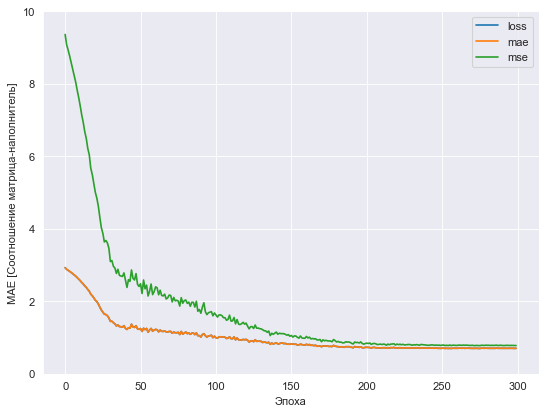

In [42]:
plt.figure(figsize=(8, 6), dpi=80)
plot_loss(history)

In [129]:
res = model.predict(x_test)
r2_score(y_test, np.ravel(res))

-0.00027637969923866024

In [208]:
y_test.shape

(277, 1)

In [209]:
a = {'Предсказанные': np.ravel(res), 'Реальные': np.ravel(y_test.values)}
results = pd.DataFrame(data = a)
results

,Предсказанные,Реальные
0,2.913728,2.770720
1,2.885356,3.955086
2,2.987276,2.223337
3,2.871152,2.407571
4,2.871152,4.422466
...,...,...
272,2.967343,3.888005
273,2.871152,2.755743
274,2.871152,3.353945
275,3.093864,2.131998


In [127]:
!%cd%

"C:\Users\qed\Documents\ds" ­Ґ пў«пҐвбп ў­гваҐ­­Ґ© Ё«Ё ў­Ґи­Ґ©
Є®¬ ­¤®©, ЁбЇ®«­пҐ¬®© Їа®Ја ¬¬®© Ё«Ё Ї ЄҐв­л¬ д ©«®¬.


In [136]:

inputs_nn = df[input_columns]
outputs_nn = df[output_columns]

norm2 = Normalizer()
res4 = norm.fit_transform(inputs_nn)
normalized_inputs2 =  pd.DataFrame(res4, columns=inputs_nn.columns)

In [137]:
poly = PolynomialFeatures(degree=3)
regressor = LinearRegression()

poly_features = poly.fit_transform(normalized_inputs2)

x_train, x_test, y_train, y_test = train_test_split(poly_features, outputs_nn, test_size=0.3)

regressor.fit(x_train, y_train)
p = regressor.predict(x_test)
r2_score(p, y_test)

-0.7704380808601627

### Меняем гиперпараметры модели и посмотрим на результат

In [59]:
model = models.Sequential(
    [
        #Flatten(input_shape=(10,)),
        normalizer,
        Dense(9, input_shape=(9,), activation='relu'),
        #Input((9,)),
        #Dropout(0.1),
        #tf.keras.layers.concatenate(inputs),
        Dense(81, activation='relu'),
        Dense(45, activation='relu'),
        #Dropout(0.4),
        Dense(1),
        #Activation('linear'),
    ]
)

In [60]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

model.compile(
    optimizer='Adagrad',
    loss='mae',
    metrics=['mae', 'mse'],
)

history = model.fit(x_train, y_train, epochs=300, verbose=False, callbacks=[tensorboard_callback])

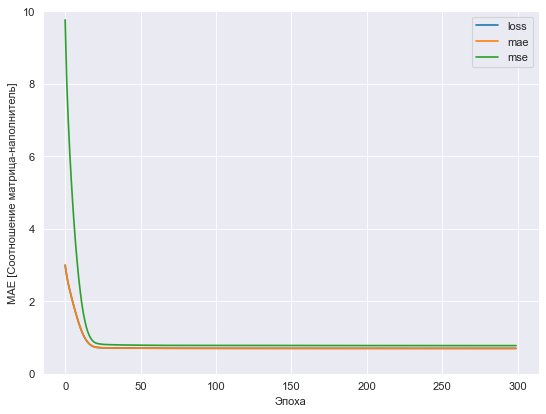

In [61]:
plt.figure(figsize=(8, 6), dpi=80)
plot_loss(history)

In [62]:
res = model.predict(x_test)
r2_score(y_test, np.ravel(res))

-0.0209348290505309